# Capstone Project - Elías Barra (Week 2)
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

Location is everything. There have been loads of studies on what made Starbucks successful, and a lot of experts claim that their key asset is their coffee shops locations.

Imagine you own a restaurant or a coffee house in a certain city and you're doingvery well. The idea of opening a second restaurant or coffee house wonders your head but, where should you put it? If you're doing well with the one that you already have, maybe you just want to replicate that in the other side of town. If your current one is not doing well, maybe you should move a different neighbourhood. Data science is a good way to solve this question.

It's an interesting cas study because it's valid for other situations. If you like your actual neighbourhood but you must move to another city, you can use the same method to determine wich neighbourhood is a good choice for you. This should be done with more than just location information. This analysis will stay just with the Foursquare data for Toronto NewYork and New York (Manhattan)

## Data <a name="data"></a>

For this analysis, the New York Data from the previous labs (taken from https://cocl.us/new_york_dataset) will be used. This data contains the names of the neighbourhoods from New York, their Boroughs, latitudes and longitudes.

For Toronto, there's two data sources. Firste, there's the Wikipedia postal codes table(taken from
https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M).

It contains the names, postal code and borough of every neighbourhood in Toronto. In second place, a csv file that has the latitude and longitude for every postal code in Toronto (taken from
https://cocl.us/Geospatial_data)

And finally, we used the Foursquare API to get information about the most popular veneus around within a 500 meters radius of every neighbourhood's coordinates. With this we can have a notion of what kind of neighbourhoods is every one of them.

## Methodology <a name="methodology"></a>

For the New York data, we must load the JSON file an extract the important features with a for loop.

The first set of Toronto's data was imported by using the pandas library method pd.read_html(). Before using the data, it had to be cleaned. This because it has some row with NaN values in it.

Then both dataframes were merged and end up having some information that we had from New York of Toronto.

Then, the Foursquare API was used to retrieve the most popular venues in every neighbourhood. This done by providing the coordinates of the neighbourhood and the Foursquare Developer Account's credentials in the API query.

With all the venues from the neighbourhoods, the next step is to use one hot encoding with the venues categories and use a machine learning algorithm called K-Means for being able to cluster the neighbourhoods in both Toronto and New York City. For that, the Python's library Sci-Kit Learn was used.

In [4]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

print('Libraries imported.')

ModuleNotFoundError: No module named 'geopy'

**Getting the New York neighbourhoods venues dataframe**

In [4]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [5]:
neighbourhoods_data = newyork_data['features']

In [6]:
column_names = ['Borough', 'Neighbourhood', 'Latitude', 'Longitude'] 

neighbourhoods = pd.DataFrame(columns=column_names)

In [7]:
for data in neighbourhoods_data:
    borough = neighbourhood_name = data['properties']['borough'] 
    neighbourhood_name = data['properties']['name']
        
    neighbourhood_latlon = data['geometry']['coordinates']
    neighbourhood_lat = neighbourhood_latlon[1]
    neighbourhood_lon = neighbourhood_latlon[0]
    
    neighbourhoods = neighbourhoods.append({'Borough': borough,
                                          'Neighbourhood': neighbourhood_name,
                                          'Latitude': neighbourhood_lat,
                                          'Longitude': neighbourhood_lon}, ignore_index=True)

In [8]:
print('The dataframe has {} boroughs and {} neighbourhoods.'.format(
        len(neighbourhoods['Borough'].unique()),
        neighbourhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighbourhoods.


In [9]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [10]:
CLIENT_ID = 'LILSMXYXRKYBEDNGQQ4DSSPTZRL2HGZL2WBQXIYFBXSBIXZE' # your Foursquare ID
CLIENT_SECRET = 'CJHKNB2IQVISKA1E4NTE5CQULYFEYSCQ41SSBA0BJ2CKDSSE' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentials:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentials:
CLIENT_ID: LILSMXYXRKYBEDNGQQ4DSSPTZRL2HGZL2WBQXIYFBXSBIXZE
CLIENT_SECRET:CJHKNB2IQVISKA1E4NTE5CQULYFEYSCQ41SSBA0BJ2CKDSSE


In [11]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius

In [12]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [13]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [14]:
ny_venues = getNearbyVenues(names=neighbourhoods['Neighbourhood'],
                                   latitudes=neighbourhoods['Latitude'],
                                   longitudes=neighbourhoods['Longitude']
                                  )

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

In [15]:
print(ny_venues.shape)
ny_venues.head()

(10046, 7)


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
2,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
3,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
4,Wakefield,40.894705,-73.847201,Shell,40.894187,-73.845862,Gas Station


In [16]:
print('There are {} uniques categories.'.format(len(ny_venues['Venue Category'].unique())))

There are 428 uniques categories.


**Getting the Toronto neighbourhoods venues dataframe**

In [17]:
df = pd.read_html("https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M")[0]
df = df[df["Borough"] != "Not assigned"]

for i in range(0,df.shape[0]):
    if df.iloc[i,2] == "Not assigned":
        df.iloc[i,2] = df.iloc[i,1]

df_coord = pd.read_csv("https://cocl.us/Geospatial_data")
total_df = pd.merge(df,df_coord,how="left",on="Postal Code")
total_df.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494


In [18]:
address = 'Toronto, Canada'

geolocator = Nominatim(user_agent="toronto_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinates of Toronto are {}, {}.'.format(latitude, longitude))

The geograpical coordinates of Toronto are 43.6534817, -79.3839347.


In [19]:
toronto_venues = getNearbyVenues(names=total_df["Neighbourhood"],latitudes=total_df["Latitude"], longitudes=total_df["Longitude"])

Parkwoods
Victoria Village
Regent Park, Harbourfront
Lawrence Manor, Lawrence Heights
Queen's Park, Ontario Provincial Government
Islington Avenue, Humber Valley Village
Malvern, Rouge
Don Mills
Parkview Hill, Woodbine Gardens
Garden District, Ryerson
Glencairn
West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale
Rouge Hill, Port Union, Highland Creek
Don Mills
Woodbine Heights
St. James Town
Humewood-Cedarvale
Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Caledonia-Fairbanks
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor, Wilson Heights, Downsview North
Thorncliffe Park
Richmond, Adelaide, King
Dufferin, Dovercourt Village
Scarborough Village
Fairview, Henry Farm, Oriole
Northwood Park, York University
East Toronto, Broadview North (Old East York)
Harbourfront East, Union Station, Toronto Islands
Little Portugal, Trinity
Kennedy Park, Ionview, East Birchmo

In [20]:
print(toronto_venues.shape)
toronto_venues.head()

(2140, 7)


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.753259,-79.329656,Brookbanks Park,43.751976,-79.332140,Park
1,Parkwoods,43.753259,-79.329656,Variety Store,43.751974,-79.333114,Food & Drink Shop
2,Parkwoods,43.753259,-79.329656,Corrosion Service Company Limited,43.752432,-79.334661,Construction & Landscaping
3,Victoria Village,43.725882,-79.315572,Victoria Village Arena,43.723481,-79.315635,Hockey Arena
4,Victoria Village,43.725882,-79.315572,Portugril,43.725819,-79.312785,Portuguese Restaurant


In [21]:
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 267 uniques categories.


*Now we merge all the venues found for both cities*

In [22]:
all_venues = pd.merge(ny_venues,toronto_venues,how="outer")
print(all_venues.shape)
all_venues.head()

(12186, 7)


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
2,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
3,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
4,Wakefield,40.894705,-73.847201,Shell,40.894187,-73.845862,Gas Station


*Now we use one hot encoding for being able to cluster these neighbourhoods*

In [23]:
# one hot encoding
venues_onehot = pd.get_dummies(all_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
venues_onehot['Neighbourhood'] = all_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [venues_onehot.columns[-1]] + list(venues_onehot.columns[:-1])
venues_onehot = venues_onehot[fixed_columns]

venues_onehot.head()

,Neighbourhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Stadium,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone

In [24]:
venues_onehot.shape

(12186, 457)

In [25]:
all_grouped = venues_onehot.groupby('Neighbourhood').mean().reset_index()
all_grouped

,Neighbourhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Stadium,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone

In [26]:
all_grouped.shape

(398, 457)

In [27]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [28]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Neighbourhood'] = all_grouped['Neighbourhood']

for ind in np.arange(all_grouped.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(all_grouped.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sorted.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Breakfast Spot,Lounge,Skating Rink,Latin American Restaurant,Egyptian Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space
1,"Alderwood, Long Branch",Pizza Place,Pub,Dance Studio,Skating Rink,Coffee Shop,Pharmacy,Sandwich Place,Gym,Pool,Financial or Legal Service
2,Allerton,Pizza Place,Deli / Bodega,Supermarket,Spa,Intersection,Discount Store,Check Cashing Service,Martial Arts Dojo,Chinese Restaurant,Fast Food Restaurant
3,Annadale,Pizza Place,Train Station,Diner,Food,Dance Studio,Deli / Bodega,Pharmacy,American Restaurant,Restaurant,Eye Doctor
4,Arden Heights,Pizza Place,Coffee Shop,Lawyer,Business Service,Bus Stop,Deli / Bodega,Pharmacy,Event Space,Farmers Market,Exhibit


**Clustering**

* We first need to merge the two coordinates dataframes:

In [29]:
neighbourhoods.head()

,Borough,Neighbourhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [30]:
total_df.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494


* We delete the Postal Code column, since we don't need it anymore and the new york data doesn't have postal codes in it:

In [32]:
total_df.drop(columns=["Postal Code"],inplace=True)
total_df.head()

,Borough,Neighbourhood,Latitude,Longitude
0,North York,Parkwoods,43.753259,-79.329656
1,North York,Victoria Village,43.725882,-79.315572
2,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494


In [33]:
all_merged = pd.merge(neighbourhoods,total_df,how="outer")
all_merged

,Borough,Neighbourhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


*Now we cluster the neighbourhoods of the two cities into 5 clusters*

In [34]:
# set number of clusters
kclusters = 5

all_grouped_clustering = all_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(all_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 0, 0, 0, 4, 0, 0, 0, 0])

In [35]:
# add clustering labels
neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
all_merged = all_merged.join(neighbourhoods_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')

all_merged.head() # check the last columns!

,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,0.0,Pharmacy,Donut Shop,Sandwich Place,Ice Cream Shop,Dessert Shop,Gas Station,Laundromat,Deli / Bodega,Exhibit,Factory
1,Bronx,Co-op City,40.874294,-73.829939,0.0,Bus Station,Restaurant,Baseball Field,Discount Store,Bagel Shop,Grocery Store,Pharmacy,Pizza Place,Fast Food Restaurant,Park
2,Bronx,Eastchester,40.887556,-73.827806,0.0,Bus Station,Caribbean Restaurant,Diner,Deli / Bodega,Bakery,Fast Food Restaurant,Metro Station,Automotive Shop,Pizza Place,Donut Shop
3,Bronx,Fieldston,40.895437,-73.905643,0.0,Music Venue,Bus Station,River,Plaza,Fast Food Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space
4,Bronx,Riverdale,40.890834,-73.912585,0.0,Park,Medical Supply Store,Bus Station,Bank,Gym,Plaza,Farmers Market,English Restaurant,Entertainment Service,Ethiopian Restaurant


In [36]:
all_merged.shape

(409, 15)

In [37]:
all_merged["Cluster Labels"].value_counts()

0.0    389
1.0      8
4.0      6
3.0      2
2.0      2
Name: Cluster Labels, dtype: int64

In [38]:
389+8+6+2+2

407

* There are two neighbourhoods that didn't get into any cluster. We will just remove them:

In [39]:
for i in range(0,all_merged.shape[0]):
    if all_merged.loc[i,"Cluster Labels"] not in ["0.0","1.0","2.0","3.0","4.0",0.0,1.0,2.0,3.0,4.0]:
        print(all_merged.loc[i,"Neighbourhood"])

York Mills, Silver Hills
Upper Rouge


In [41]:
clean1 = all_merged[all_merged["Neighbourhood"] != "York Mills, Silver Hills"]
clean1.shape

(408, 15)

In [42]:
clean2 = clean1[clean1["Neighbourhood"] != "Upper Rouge"]
clean2.shape

(407, 15)

In [43]:
all_merged = clean2

## Results and Discussion <a name="results"></a>


As a result, five clusters where obtained. Cluster 1 neighbourhoods were displayed in red, Cluster 2 in purple, Cluster 3 in blue, Cluster 4 in cyan/light-green and Cluster 5 in orange.

**Displaying the new clusters in the map**

*The Toronto cluster map*

In [114]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10.4)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(all_merged['Latitude'], all_merged['Longitude'], all_merged['Neighbourhood'], all_merged['Cluster Labels']):
    u = int(cluster)
    label = folium.Popup(str(poi) + ' Cluster ' + str(u), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[u-1],
        fill=True,
        fill_color=rainbow[u-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

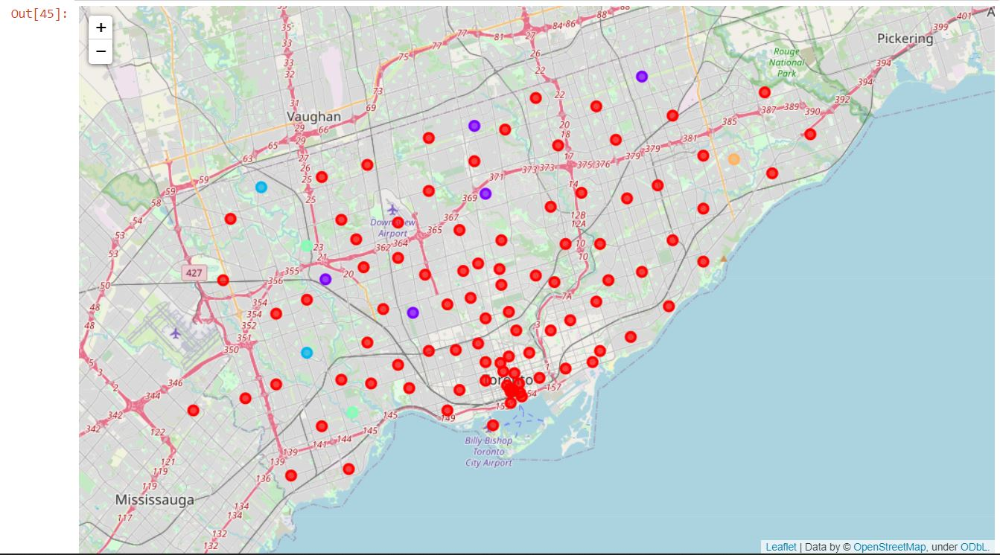

*The New York cluster map*

In [115]:
latitude = 40.7127281
longitude = -74.0060152

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10.4)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(all_merged['Latitude'], all_merged['Longitude'], all_merged['Neighbourhood'], all_merged['Cluster Labels']):
    u = int(cluster)
    label = folium.Popup(str(poi) + ' Cluster ' + str(u), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[u-1],
        fill=True,
        fill_color=rainbow[u-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

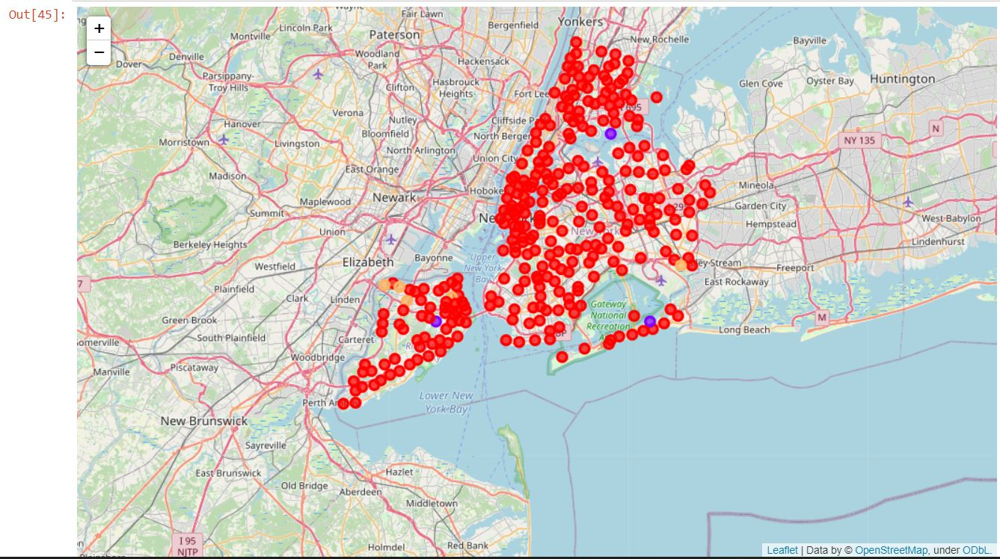

## Exploring the clusters

* We will add a column to the clusters dataframe indicating to which city every neighbourhood belongs. For that, we will make a list with every neighbourhood's name for both cities:

In [107]:
toronto_neighs = []
ny_neighs = []

for i in range(0,total_df.shape[0]):
    toronto_neighs.append(total_df.loc[i,"Neighbourhood"])
    
for i in range(0,neighbourhoods.shape[0]):
    ny_neighs.append(neighbourhoods.loc[i,"Neighbourhood"])

### And finally, now we add the City column and display every cluster:

In [108]:
c1 = all_merged.loc[all_merged['Cluster Labels'] == 0.0, all_merged.columns[[1] + list(range(5, all_merged.shape[1]))]]
c1.reset_index(inplace=True)

c1["City"] = 0
for i in range(0,c1.shape[0]):
    if c1.loc[i,"Neighbourhood"] in ny_neighs:
        c1.loc[i,"City"] = "New York"
    if c1.loc[i,"Neighbourhood"] in toronto_neighs:
        c1.loc[i,"City"] = "Toronto"

c1

,index,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,City
0,0,Wakefield,Pharmacy,Donut Shop,Sandwich Place,Ice Cream Shop,Dessert Shop,Gas Station,Laundromat,Deli / Bodega,Exhibit,Factory,New York
1,1,Co-op City,Bus Station,Restaurant,Baseball Field,Discount Store,Bagel Shop,Grocery Store,Pharmacy,Pizza Place,Fast Food Restaurant,Park,New York
2,2,Eastchester,Bus Station,Caribbean Restaurant,Diner,Deli / Bodega,Bakery,Fast Food Restaurant,Metro Station,Automotive Shop,Pizza Place,Donut Shop,New York
3,3,Fieldston,Music Venue,Bus Station,River,Plaza,Fast Food Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,New York
4,4,Riverdale,Park,Medical Supply Store,Bus Station,Bank,Gym,Plaza,Farmers Market,English Restaurant,Entertainment Service,Ethiopian Restaurant,New York
5,5,Kingsbridge,Pizza Place,Bar,Sandwich Place,Mexican Restaurant,Latin American Restaurant,Spanish Restaurant,Donut Shop,Pharmacy,Supermarket,Bakery,New York
6,6,Marble Hill,Gym,Coffee Shop,Yoga Studio,Pizza Place,Supplement Shop,Steakhouse,Shopping Mall,Seafood Restaurant,Sandwich Place,Deli / Bodega,New York
7,7,Woodlawn,Pizza Place,Deli / Bodega,Pub,Playground,Cosmetics Shop,Bar,Bus Stop,Rental Car Location,Pharmacy,Train Station,New York
8,8,Norwood,Pizza Place,Park,Chinese Restaurant,Bank,Pharmacy,Coffee Shop,Restaurant,Liquor Store,Sandwich Place,Mexican Restaurant,New York
9,9,Williamsbridge,Soup Place,Bar,Nightclub,Caribbean Restaurant,Fast Food Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,New York


In [109]:
c2 = all_merged.loc[all_merged['Cluster Labels'] == 1.0, all_merged.columns[[1] + list(range(5, all_merged.shape[1]))]]
c2.reset_index(inplace=True)

c2["City"] = 0
for i in range(0,c2.shape[0]):
    if c2.loc[i,"Neighbourhood"] in ny_neighs:
        c2.loc[i,"City"] = "New York"
    if c2.loc[i,"Neighbourhood"] in toronto_neighs:
        c2.loc[i,"City"] = "Toronto"

c2

,index,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,City
0,27,Clason Point,Park,Convenience Store,Bus Stop,Boat or Ferry,Grocery Store,Pool,South American Restaurant,Ethiopian Restaurant,Event Space,Farmers Market,New York
1,192,Somerville,Park,Yoga Studio,Egyptian Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,New York
2,203,Todt Hill,Park,Yoga Studio,Egyptian Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,New York
3,327,Caledonia-Fairbanks,Park,Women's Store,Pool,Fast Food Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Toronto
4,358,"Willowdale, Newtonbrook",Park,Yoga Studio,Egyptian Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Toronto
5,370,Weston,Convenience Store,Park,Yoga Studio,Fast Food Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Toronto
6,372,York Mills West,Park,Convenience Store,Yoga Studio,Fast Food Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Toronto
7,391,"Milliken, Agincourt North, Steeles East, L'Amo...",Park,Playground,Yoga Studio,Fast Food Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Toronto


In [110]:
c3 = all_merged.loc[all_merged['Cluster Labels'] == 2.0, all_merged.columns[[1] + list(range(5, all_merged.shape[1]))]]
c3.reset_index(inplace=True)

c3["City"] = 0
for i in range(0,c3.shape[0]):
    if c3.loc[i,"Neighbourhood"] in ny_neighs:
        c3.loc[i,"City"] = "New York"
    if c3.loc[i,"Neighbourhood"] in toronto_neighs:
        c3.loc[i,"City"] = "Toronto"

c3

,index,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,City
0,311,"Islington Avenue, Humber Valley Village",Pizza Place,Yoga Studio,Farmers Market,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Toronto
1,356,Humber Summit,Pizza Place,Yoga Studio,Farmers Market,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Toronto


In [111]:
c4 = all_merged.loc[all_merged['Cluster Labels'] == 3.0, all_merged.columns[[1] + list(range(5, all_merged.shape[1]))]]
c4.reset_index(inplace=True)

c4["City"] = 0
for i in range(0,c4.shape[0]):
    if c4.loc[i,"Neighbourhood"] in ny_neighs:
        c4.loc[i,"City"] = "New York"
    if c4.loc[i,"Neighbourhood"] in toronto_neighs:
        c4.loc[i,"City"] = "Toronto"

c4

,index,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,City
0,363,"Humberlea, Emery",Baseball Field,Yoga Studio,Electronics Store,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Factory,Toronto
1,407,"Old Mill South, King's Mill Park, Sunnylea, Hu...",Baseball Field,Business Service,Yoga Studio,Field,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Toronto


In [112]:
c5 = all_merged.loc[all_merged['Cluster Labels'] == 4.0, all_merged.columns[[1] + list(range(5, all_merged.shape[1]))]]
c5.reset_index(inplace=True)

c5["City"] = 0
for i in range(0,c5.shape[0]):
    if c5.loc[i,"Neighbourhood"] in ny_neighs:
        c5.loc[i,"City"] = "New York"
    if c5.loc[i,"Neighbourhood"] in toronto_neighs:
        c5.loc[i,"City"] = "Toronto"

c5

,index,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,City
0,193,Brookville,Recording Studio,Deli / Bodega,Fast Food Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,New York
1,202,Grymes Hill,Deli / Bodega,Dog Run,Yoga Studio,Field,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,New York
2,226,Graniteville,Boat or Ferry,Grocery Store,Yoga Studio,Field,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,New York
3,227,Arlington,Deli / Bodega,Bus Stop,Coffee Shop,Construction & Landscaping,Boat or Ferry,Eye Doctor,Farmers Market,Farm,Falafel Restaurant,Factory,New York
4,257,Howland Hook,Boat or Ferry,Yoga Studio,Field,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Factory,New York
5,328,Woburn,Coffee Shop,Korean Restaurant,Fast Food Restaurant,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Toronto


Based on the results, some conclusions can be made:

- Clason Point, Somerville and Todt Hill from New York are similar to Caledonia-Fairbanks, Willowdale, Newtonbrook, Weston, York Mills West, Milliken, Agincourt North, Steeles East and L'Amoreaux East from Toronto.

- Islington Avenue, Humber Valley Village and Humber Summit from Toronto are similar

- Humberlea, Emery, Old Mill South, King's Mill Park, Sunnylea Humber Bay, Mimico NE, The Queensway Easte, Royal York South East and Kingsway Park South East from Toronto are similar.

- Brookville, Grymes Hill, Granitville, Arlington and Howland Hook from New York are similar to Woburn from Toronto.

- And the rest of the neighourhoods from New York are similar to the rest of the neighbourhoods from Toronto.

Based on the most common venues of each cluster, some cluster characteristics can be drawn:

- Cluster 1 neighbourhoods have banks, bus stations, pizza places and pharmacies, among others.

- Cluster 2 neighbouhoods have parks, yoga studios, convenience stores, event spaces and restaurants.

- Cluster 3 neighbourhoods have pizza places, yoga studios, farmers markets, electronic stores, restaurants, entertainment services, event spaces and exhibits.

- Cluster 4 neighbourhoods have baseball fields, yoga studios, restaurants, eye doctors and exhibits.

- Cluster 5 neighbourhoods have deli/bodegas, restaurants, entertainment services and boats or ferries

## Conclusion <a name="conclusion"></a>

It can be concluded that there are a lot of neighbourdhoods from both cities that are similar. And also, there's a lot of neighbourhoods that are very similar, even if they are not closer to each other. This is a demonstration of how powerfull and useful machine learning algorithms can be and how universally they can be used.

It's important to clarify that the similarity that's been found it's based on the main venues categories from each negihbourhood. It would be interesting to conduct the same study but adding new features such as poppulation density, crime rates, human development index, men/women ratio, etc.